# Dataset

Os dados são de clientes do Ifood visando criar a segmentação de clientes e um modelo que consiga prever a probabilidade do cliente ser impactado por uma campanha de oferta

## Metadados
Pessoas:
- ID: Identificador único do cliente
- Year_Birth: Ano de nascimento do cliente
- Education: Nível de educação do cliente
- Marital_Status: Estado civil do cliente
- Income: Renda anual do agregado familiar do cliente
- Kidhome: Número de crianças no agregado familiar do cliente
- Teenhome: Número de adolescentes no agregado familiar do cliente
- Dt_Customer: Data de inscrição do cliente na empresa
- Recency: Número de dias desde a última compra do cliente
- Complain: 1 se o cliente fez uma reclamação nos últimos 2 anos, 0 caso contrário

-----------------

Produtos
- MntWines: Valor gasto em vinho nos últimos 2 anos
- MntFruits: Valor gasto em frutas nos últimos 2 anos
- MntMeatProducts: Valor gasto em carne nos últimos 2 anos
- MntFishProducts: Valor gasto em peixe nos últimos 2 anos
- MntSweetProducts: Valor gasto em doces nos últimos 2 anos
- MntGoldProds: Valor gasto em ouro nos últimos 2 anos

-----------------

Promoção:
- NumDealsPurchases: Número de compras feitas com desconto
- AcceptedCmp1: 1 se o cliente aceitou a oferta na 1ª campanha, 0 caso contrário
- AcceptedCmp2: 1 se o cliente aceitou a oferta na 2ª campanha, 0 caso contrário
- AcceptedCmp3: 1 se o cliente aceitou a oferta na 3ª campanha, 0 caso contrário
- AcceptedCmp4: 1 se o cliente aceitou a oferta na 4ª campanha, 0 caso contrário
- AcceptedCmp5: 1 se o cliente aceitou a oferta na 5ª campanha, 0 caso contrário
- Response: 1 se o cliente aceitou a oferta na última campanha, 0 caso contrário

-----------------

Meio:
- NumWebPurchases: Número de compras feitas através do site da empresa
- NumCatalogPurchases: Número de compras feitas usando um catálogo
- NumStorePurchases: Número de compras feitas diretamente em lojas
- NumWebVisitsMonth: Número de visitas ao site da empresa no último mês

# Importações

In [129]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import scipy.stats as st
from sklearn.model_selection import train_test_split, StratifiedKFold, cross_validate, GridSearchCV
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay, classification_report, make_scorer, recall_score, f1_score, accuracy_score
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from sklearn.ensemble import AdaBoostClassifier
import warnings
warnings.simplefilter(action='ignore', category=Warning)

# EDA

## Investigação inicial do dataset

In [2]:
df = pd.read_csv('marketing_campaign.csv', sep="\t")

In [3]:
df.head()

,ID,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,...,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Z_CostContact,Z_Revenue,Response
0,5524,1957,Graduation,Single,58138.0,0,0,04-09-2012,58,635,...,7,0,0,0,0,0,0,3,11,1
1,2174,1954,Graduation,Single,46344.0,1,1,08-03-2014,38,11,...,5,0,0,0,0,0,0,3,11,0
2,4141,1965,Graduation,Together,71613.0,0,0,21-08-2013,26,426,...,4,0,0,0,0,0,0,3,11,0
3,6182,1984,Graduation,Together,26646.0,1,0,10-02-2014,26,11,...,6,0,0,0,0,0,0,3,11,0
4,5324,1981,PhD,Married,58293.0,1,0,19-01-2014,94,173,...,5,0,0,0,0,0,0,3,11,0


In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2240 entries, 0 to 2239
Data columns (total 29 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   ID                   2240 non-null   int64  
 1   Year_Birth           2240 non-null   int64  
 2   Education            2240 non-null   object 
 3   Marital_Status       2240 non-null   object 
 4   Income               2216 non-null   float64
 5   Kidhome              2240 non-null   int64  
 6   Teenhome             2240 non-null   int64  
 7   Dt_Customer          2240 non-null   object 
 8   Recency              2240 non-null   int64  
 9   MntWines             2240 non-null   int64  
 10  MntFruits            2240 non-null   int64  
 11  MntMeatProducts      2240 non-null   int64  
 12  MntFishProducts      2240 non-null   int64  
 13  MntSweetProducts     2240 non-null   int64  
 14  MntGoldProds         2240 non-null   int64  
 15  NumDealsPurchases    2240 non-null   i

In [5]:
df.duplicated().sum()

0

In [6]:
df['Education'].value_counts()

Graduation    1127
PhD            486
Master         370
2n Cycle       203
Basic           54
Name: Education, dtype: int64

In [7]:
df['Marital_Status'].value_counts()

Married     864
Together    580
Single      480
Divorced    232
Widow        77
Alone         3
Absurd        2
YOLO          2
Name: Marital_Status, dtype: int64

In [8]:
df['Dt_Customer'].value_counts()

31-08-2012    12
12-09-2012    11
14-02-2013    11
12-05-2014    11
20-08-2013    10
              ..
05-08-2012     1
18-11-2012     1
25-05-2013     1
14-04-2013     1
09-01-2014     1
Name: Dt_Customer, Length: 663, dtype: int64

In [9]:
df['Z_CostContact'].value_counts()

3    2240
Name: Z_CostContact, dtype: int64

In [10]:
df['Z_Revenue'].value_counts()

11    2240
Name: Z_Revenue, dtype: int64

In [11]:
df['Income'].isna().sum()

24

## Ajuste inicial dos dados

In [12]:
df2 = df.copy(deep=True)

In [13]:
df2['Marital_Status'] = df2['Marital_Status'].map({'Single': 'Single', 'Together': 'Together', 'Married': 'Married', 'Divorced': 'Divorced', 'Widow': 'Widow', 'Alone': 'Single', 'Absurd': 'Single', 'YOLO': 'Single'})

In [14]:
df2.drop(columns=['Z_CostContact', 'Z_Revenue'], inplace=True)

In [15]:
df2['Income'] = df2['Income'].apply(lambda x: 0 if np.isnan(x) else x)

In [16]:
df2['Age'] = df2['Year_Birth'].apply(lambda x: 2020 - x)

## Visualização inicial dos dados

### Pessoas

### Ano de Nascimento

<Axes: xlabel='Year_Birth', ylabel='Count'>

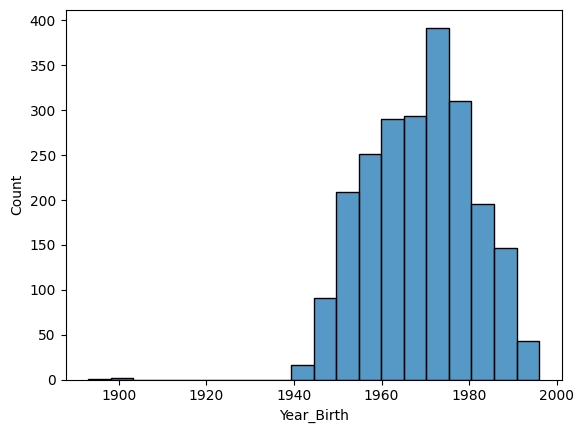

In [17]:
sns.histplot(df2, x="Year_Birth", bins=20)

### Escolaridade

<Axes: xlabel='Education', ylabel='Count'>

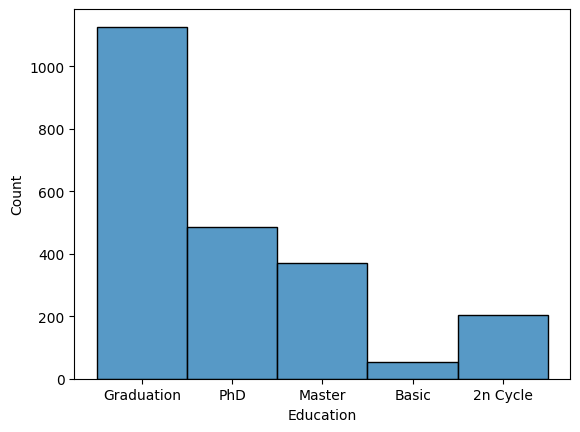

In [18]:
sns.histplot(df2, x="Education", bins=20)

### Estado civil

<Axes: xlabel='Marital_Status', ylabel='Count'>

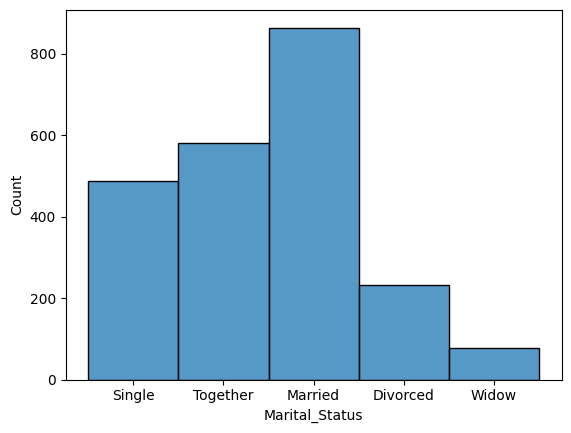

In [19]:
sns.histplot(df2, x="Marital_Status", bins=20)

### Renda Anual

<Axes: xlabel='Income', ylabel='Count'>

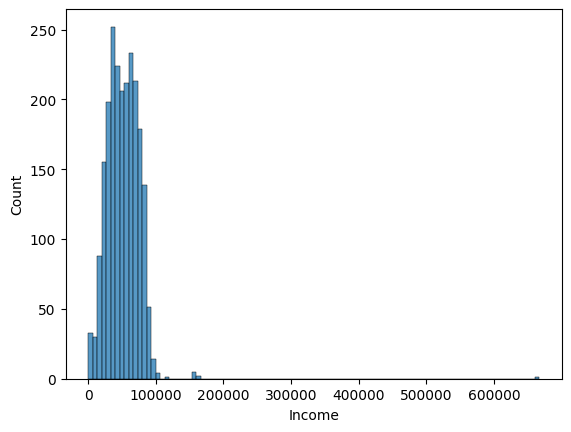

In [20]:
sns.histplot(df2, x="Income", bins=100)

### Número de crianças

<Axes: xlabel='Kidhome', ylabel='Count'>

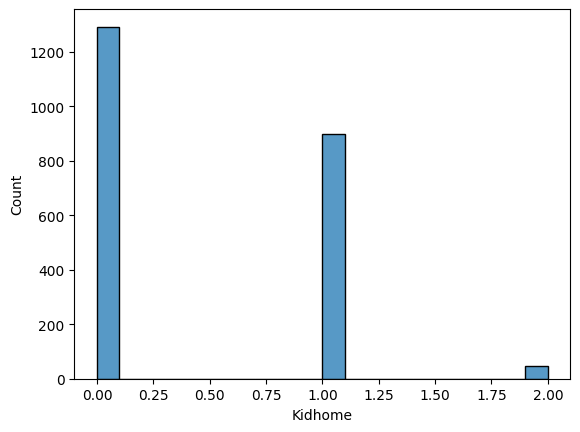

In [21]:
sns.histplot(df2, x="Kidhome", bins=20)

### Número de adolescentes

<Axes: xlabel='Teenhome', ylabel='Count'>

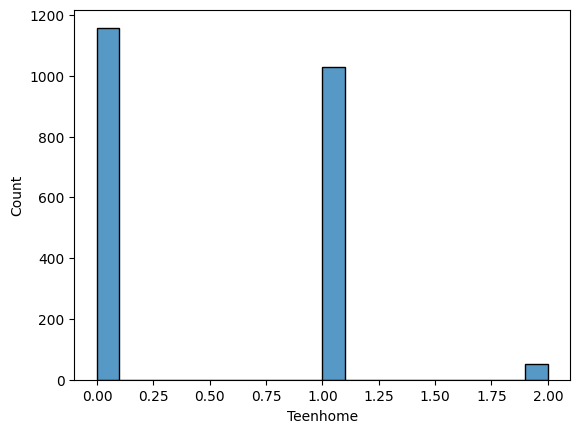

In [22]:
sns.histplot(df2, x="Teenhome", bins=20)

### Data de inscrição na empresa

<Axes: xlabel='Dt_Customer', ylabel='Count'>

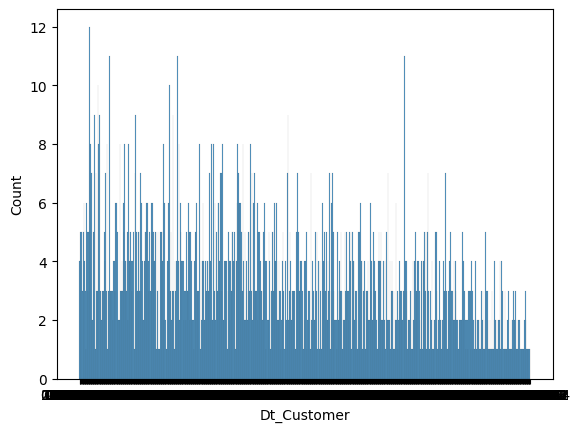

In [23]:
sns.histplot(df2, x="Dt_Customer", bins=20)

### Dias desde a última compra

<Axes: xlabel='Recency', ylabel='Count'>

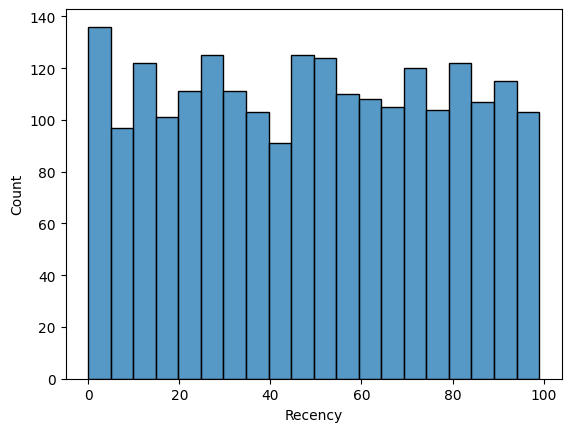

In [24]:
sns.histplot(df2, x="Recency", bins=20)

### Reclamação nos últimos 2 anos

<Axes: xlabel='Complain', ylabel='Count'>

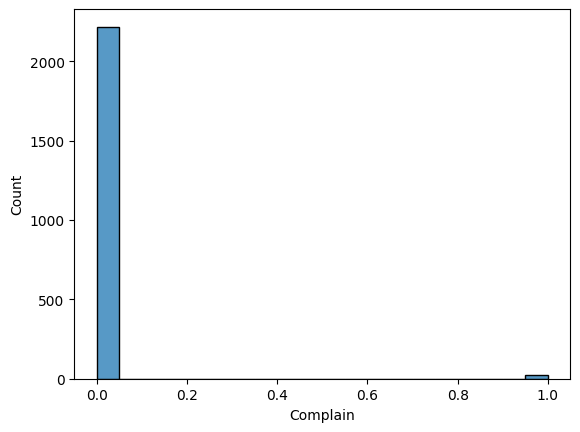

In [25]:
sns.histplot(df2, x="Complain", bins=20)

### Produtos

**Valores gastos em produtos nos últimos 2 anos**

### Vinho

<Axes: xlabel='MntWines', ylabel='Count'>

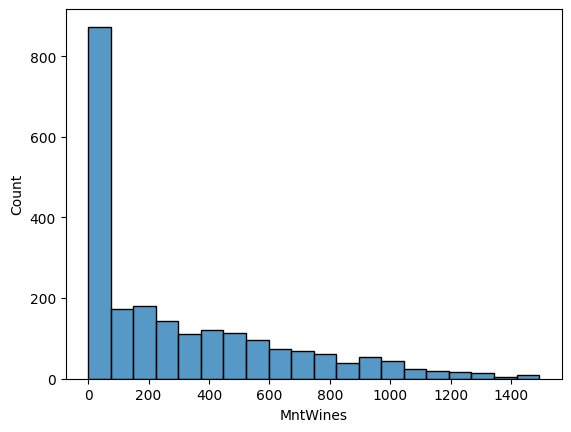

In [26]:
sns.histplot(df2, x="MntWines", bins=20)

### Frutas

<Axes: xlabel='MntFruits', ylabel='Count'>

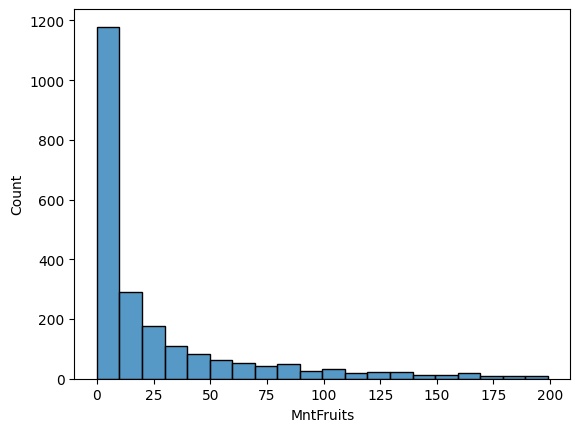

In [27]:
sns.histplot(df2, x="MntFruits", bins=20)

### Carnes

<Axes: xlabel='MntMeatProducts', ylabel='Count'>

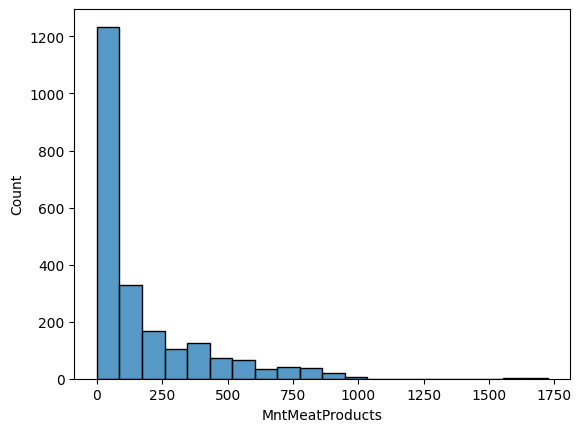

In [28]:
sns.histplot(df2, x="MntMeatProducts", bins=20)

### Peixes

<Axes: xlabel='MntFishProducts', ylabel='Count'>

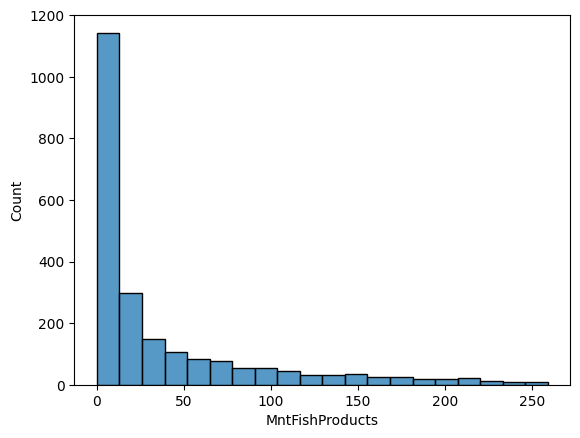

In [29]:
sns.histplot(df2, x="MntFishProducts", bins=20)

### Doces

<Axes: xlabel='MntSweetProducts', ylabel='Count'>

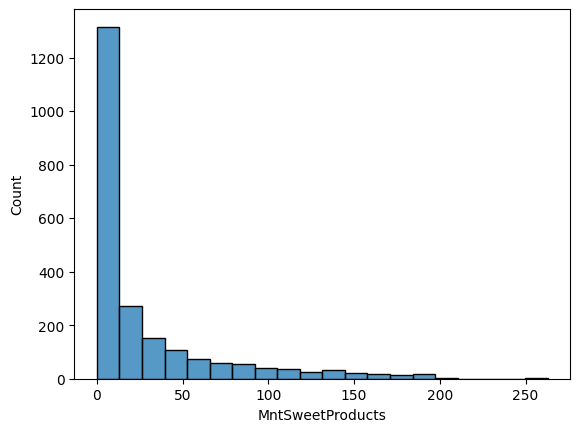

In [30]:
sns.histplot(df2, x="MntSweetProducts", bins=20)

### Produtos Ouro

<Axes: xlabel='MntGoldProds', ylabel='Count'>

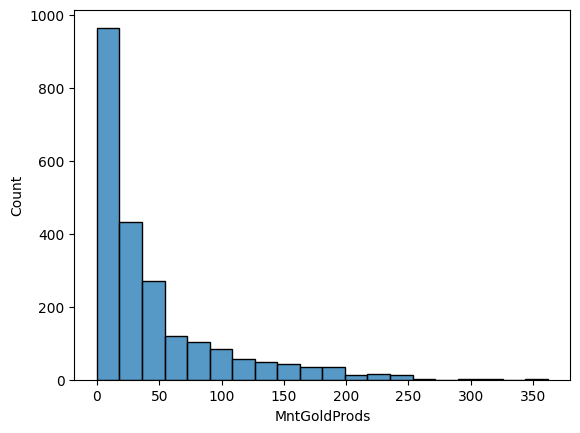

In [31]:
sns.histplot(df2, x="MntGoldProds", bins=20)

### Promoção

### Compras com desconto

<Axes: xlabel='NumDealsPurchases', ylabel='Count'>

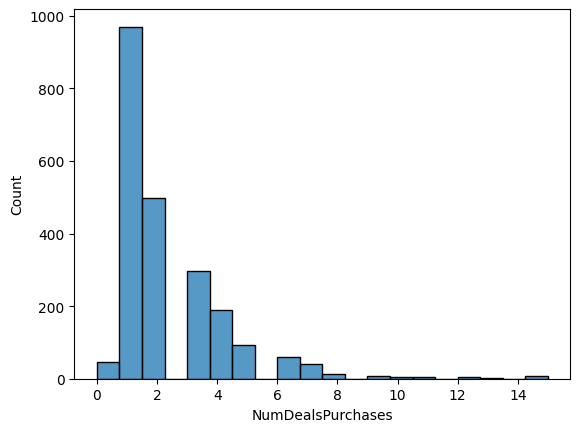

In [ ]:
sns.histplot(df2, x="NumDealsPurchases", bins=20)

### Compra na 1ª oferta

<Axes: xlabel='AcceptedCmp1', ylabel='Count'>

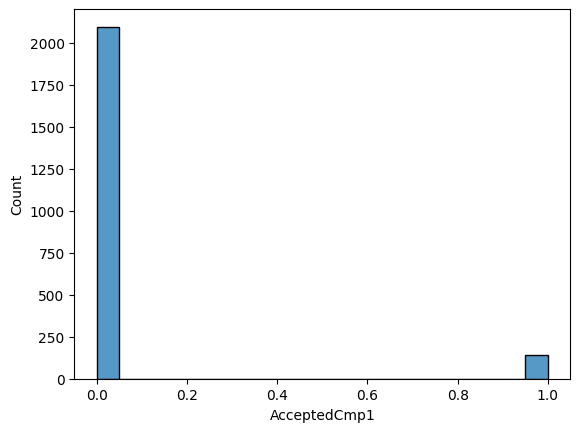

In [ ]:
sns.histplot(df2, x="AcceptedCmp1", bins=20)

### Compra na 2ª oferta

<Axes: xlabel='AcceptedCmp2', ylabel='Count'>

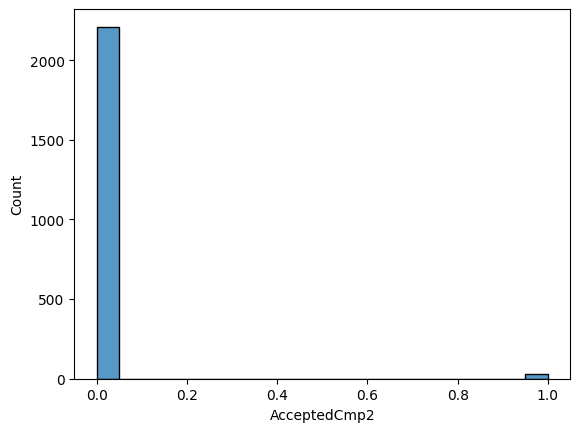

In [ ]:
sns.histplot(df2, x="AcceptedCmp2", bins=20)

### Compra na 3ª oferta

<Axes: xlabel='AcceptedCmp3', ylabel='Count'>

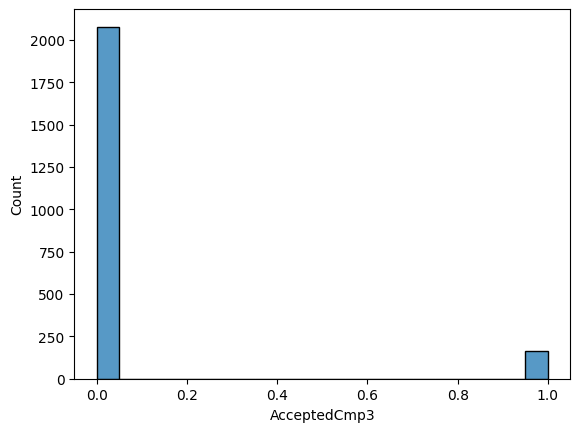

In [ ]:
sns.histplot(df2, x="AcceptedCmp3", bins=20)

### Compra na 4ª oferta

<Axes: xlabel='AcceptedCmp4', ylabel='Count'>

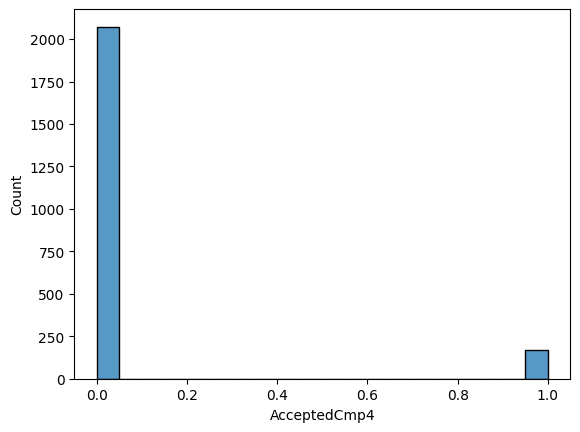

In [ ]:
sns.histplot(df2, x="AcceptedCmp4", bins=20)

### Compra na 5ª oferta

<Axes: xlabel='AcceptedCmp5', ylabel='Count'>

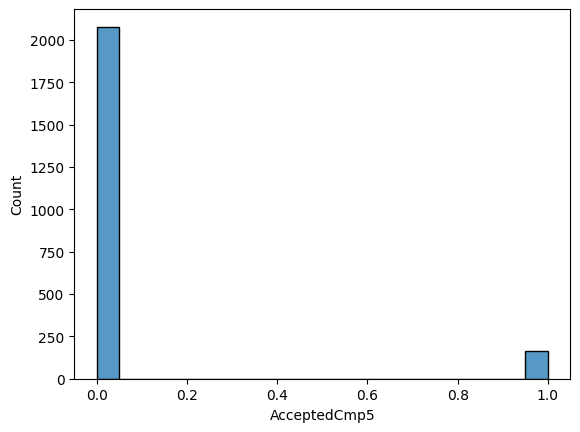

In [ ]:
sns.histplot(df2, x="AcceptedCmp5", bins=20)

### Compra na última oferta

<Axes: xlabel='Response', ylabel='Count'>

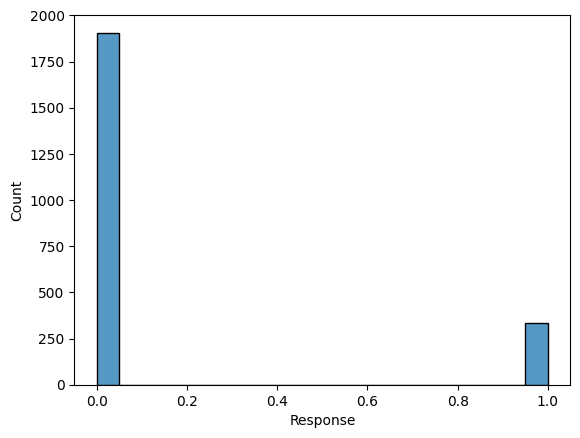

In [ ]:
sns.histplot(df2, x="Response", bins=20)

### Meio

### Compras feitas por site

<Axes: xlabel='NumWebPurchases', ylabel='Count'>

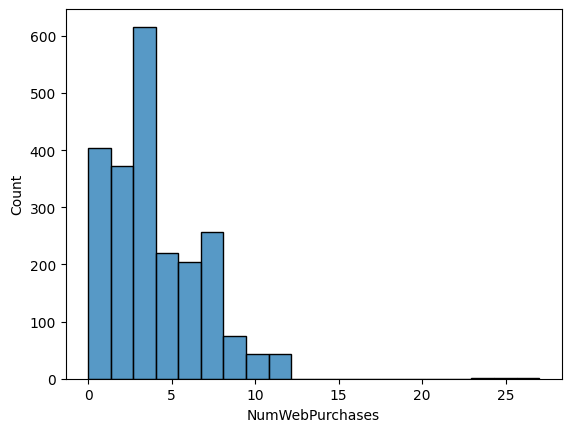

In [ ]:
sns.histplot(df2, x="NumWebPurchases", bins=20)

### Compras feitas com catálogo

<Axes: xlabel='NumCatalogPurchases', ylabel='Count'>

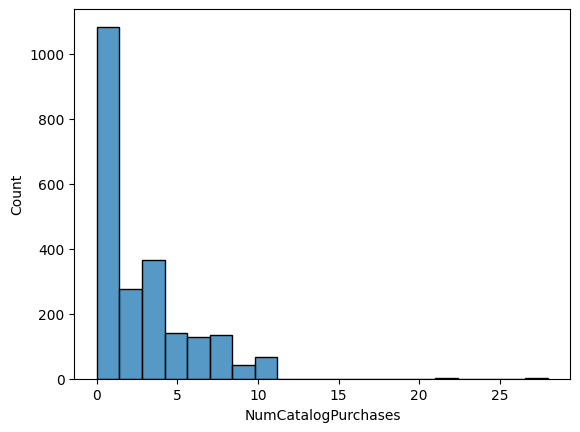

In [ ]:
sns.histplot(df2, x="NumCatalogPurchases", bins=20)

### Compras feitas diretamente nas lojas

<Axes: xlabel='NumStorePurchases', ylabel='Count'>

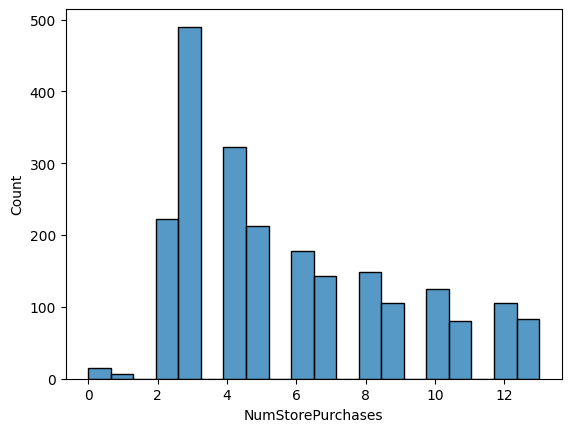

In [ ]:
sns.histplot(df2, x="NumStorePurchases", bins=20)

### Visitas feitas ao site no último mês

<Axes: xlabel='NumWebVisitsMonth', ylabel='Count'>

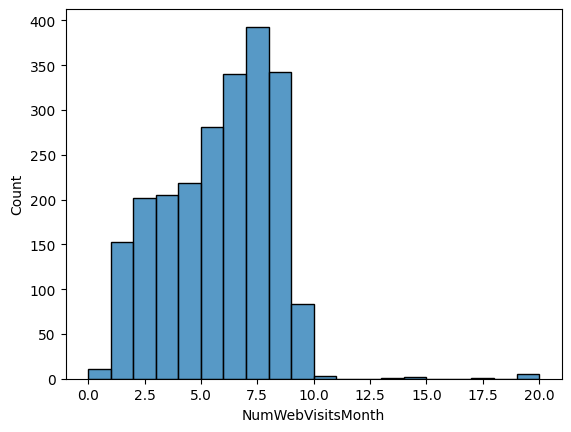

In [ ]:
sns.histplot(df2, x="NumWebVisitsMonth", bins=20)

# Transformações e adições

### Educação

Sugestão da Julia: deixar educação como escalar

In [33]:
df2['Education'] = df2['Education'].map({'Basic': 1, '2n Cycle': 2, 'Graduation': 3, 'Master': 4, 'PhD': 5})

### Estado civil

In [36]:
df2 = pd.get_dummies(df2, columns=["Marital_Status"], prefix="Marital_Status")

### Renda Anual

In [37]:
df2['Income'] = df2['Income'].apply(lambda x: int(x))

### Compra em oferta

In [38]:
df2['AcceptedCmpOverall'] = df2['AcceptedCmp1'] + df2['AcceptedCmp2'] + df2['AcceptedCmp3'] + df2['AcceptedCmp4'] + df2['AcceptedCmp5'] + df2['Response']

In [40]:
df2['AcceptedCmpOverall'] = df2['AcceptedCmpOverall'].apply(lambda x: 1 if x>0 else 0)

# Ajustes prévios a modelagem

In [42]:
df2.columns

Index(['ID', 'Year_Birth', 'Education', 'Income', 'Kidhome', 'Teenhome',
       'Dt_Customer', 'Recency', 'MntWines', 'MntFruits', 'MntMeatProducts',
       'MntFishProducts', 'MntSweetProducts', 'MntGoldProds',
       'NumDealsPurchases', 'NumWebPurchases', 'NumCatalogPurchases',
       'NumStorePurchases', 'NumWebVisitsMonth', 'AcceptedCmp3',
       'AcceptedCmp4', 'AcceptedCmp5', 'AcceptedCmp1', 'AcceptedCmp2',
       'Complain', 'Response', 'Age', 'Marital_Status_Divorced',
       'Marital_Status_Married', 'Marital_Status_Single',
       'Marital_Status_Together', 'Marital_Status_Widow',
       'AcceptedCmpOverall'],
      dtype='object')

In [43]:
df2.drop(columns=['ID', 'Year_Birth', 'Dt_Customer'], inplace=True)

# Análise de correlações

<Axes: >

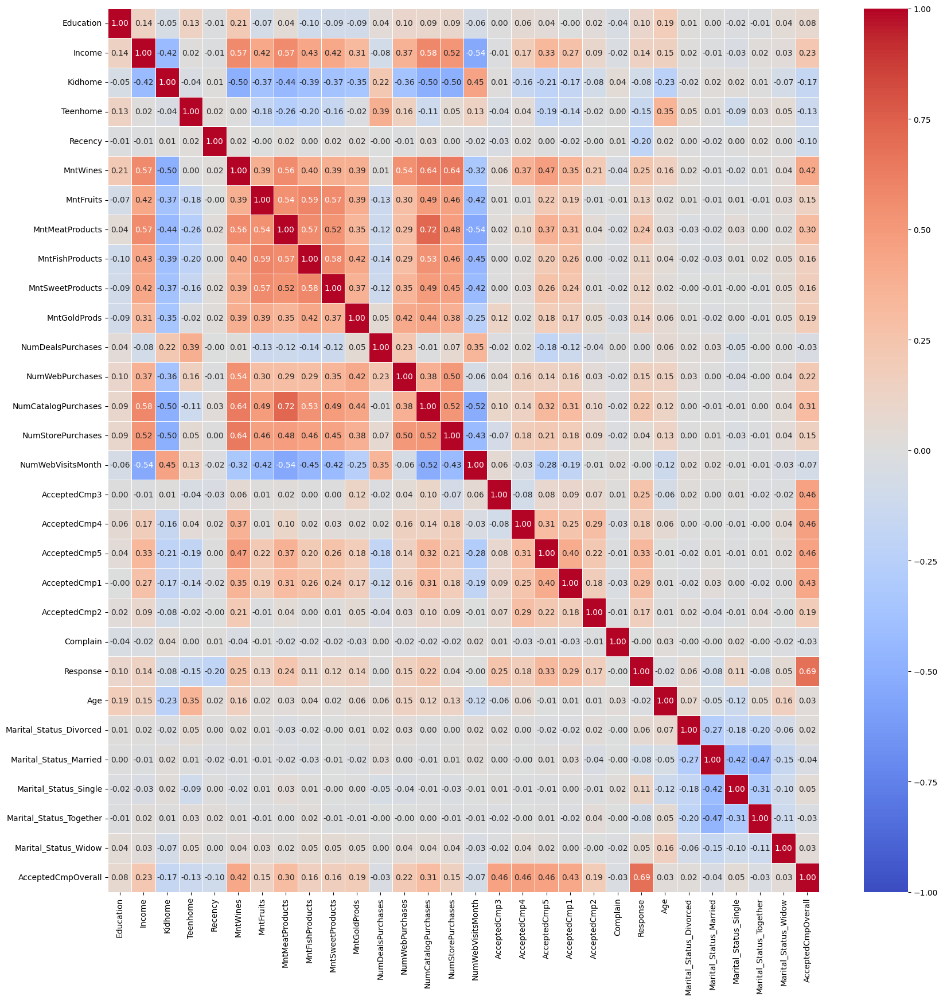

In [44]:
plt.figure(figsize=(20,20))
sns.heatmap(df2.corr(), vmax=1, vmin=-1, cmap='coolwarm', annot=True, linewidths=0.5, fmt='.2f')

In [50]:
sns.pairplot(df2, hue = 'AcceptedCmpOverall')

In [45]:
target_corr_temp = abs(df2.corr().drop(columns=['AcceptedCmp1','AcceptedCmp2','AcceptedCmp3','AcceptedCmp4','AcceptedCmp5','Response','AcceptedCmpOverall']).loc['AcceptedCmpOverall']).sort_values(ascending=False)

target_corr = {}
df2_columns_to_drop = []

for i in range(len(target_corr_temp.index)):
  if target_corr_temp.values[i] >= 0.05:
    target_corr[target_corr_temp.index[i]] = target_corr_temp.values[i]
  else:
    df2_columns_to_drop.append(target_corr_temp.index[i])

target_corr = pd.Series(data=target_corr)

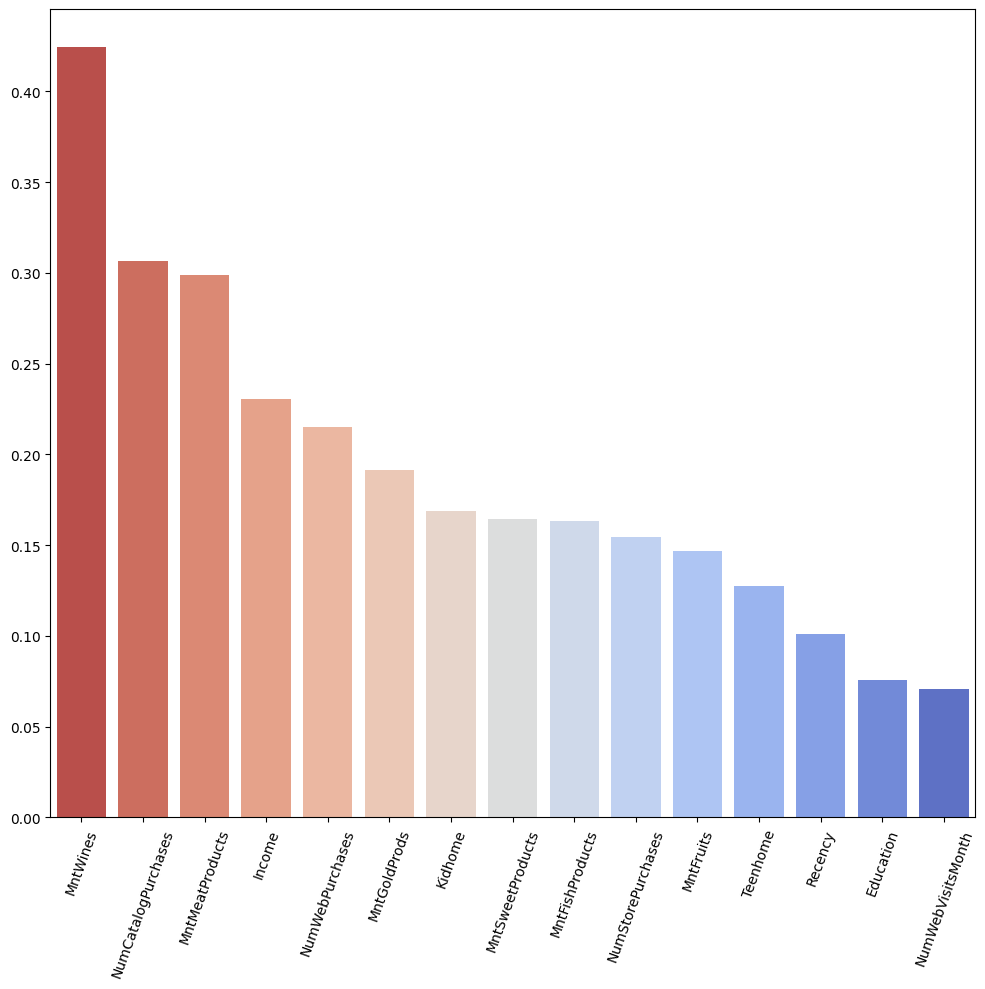

In [46]:
plt.figure(figsize=(10,10))
sns.barplot(x=target_corr.index, y=target_corr.values, palette='coolwarm_r')
plt.xticks(rotation=70)
plt.tight_layout()

Baseado no heatmap, para o nosso target 'AcceptecCmpOverall', faz sentido droparmos as seguintes colunas:
 - 'AcceptedCmp1' (Multicolinearidade)
 - 'AcceptedCmp2' (Multicolinearidade)
 - 'AcceptedCmp3' (Multicolinearidade)
 - 'AcceptedCmp4' (Multicolinearidade)
 - 'AcceptedCmp5' (Multicolinearidade)
 - 'Response' (Multicolinearidade)

 Além disso, vamos manter um mínimo de 0.05 para correlação absoluta

In [47]:
df2_columns_to_drop.append('AcceptedCmp1')
df2_columns_to_drop.append('AcceptedCmp2')
df2_columns_to_drop.append('AcceptedCmp3')
df2_columns_to_drop.append('AcceptedCmp4')
df2_columns_to_drop.append('AcceptedCmp5')
df2_columns_to_drop.append('Response')

In [48]:
df2_predictive_model = df2.copy(deep=True)
df2_predictive_model.drop(columns=df2_columns_to_drop, inplace=True)

In [49]:
df2_predictive_model

,Education,Income,Kidhome,Teenhome,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,AcceptedCmpOverall
0,3,58138,0,0,58,635,88,546,172,88,88,8,10,4,7,1
1,3,46344,1,1,38,11,1,6,2,1,6,1,1,2,5,0
2,3,71613,0,0,26,426,49,127,111,21,42,8,2,10,4,0
3,3,26646,1,0,26,11,4,20,10,3,5,2,0,4,6,0
4,5,58293,1,0,94,173,43,118,46,27,15,5,3,6,5,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2235,3,61223,0,1,46,709,43,182,42,118,247,9,3,4,5,0
2236,5,64014,2,1,56,406,0,30,0,0,8,8,2,5,7,1
2237,3,56981,0,0,91,908,48,217,32,12,24,2,3,13,6,1
2238,4,69245,0,1,8,428,30,214,80,30,61,6,5,10,3,0


# Análise Preditiva

## Separação dos dados

In [101]:
y = df2_predictive_model['AcceptedCmpOverall']
X = df2_predictive_model.drop(columns=['AcceptedCmpOverall'])

In [102]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.3, stratify=y, random_state=42)

### Regressão Logística

In [103]:
# Pipeline:
etapas = [('std_scaler', StandardScaler()),
          ('log_reg', LogisticRegression())]

pipe = Pipeline(etapas)

In [104]:
# KFold Estratificado para CV:
grupo = StratifiedKFold(n_splits=10, shuffle=True, random_state=42)

metrica = make_scorer(accuracy_score)

In [105]:
# Otimização de hiperparâmetros com GridSearch:
param_grid = {
    'log_reg__penalty' : ['', 'l1', 'l2', 'elasticnet'],
    'log_reg__solver'  : ['lbfgs', 'liblinear', 'newton-cg', 'newton-cholesky', 'sag', 'saga']
}

grid = GridSearchCV(estimator=pipe,
                        param_grid=param_grid,
                        scoring=metrica,
                        cv=grupo,
                        n_jobs=-1)

grid.fit(X_train, y_train)

GridSearchCV(cv=StratifiedKFold(n_splits=10, random_state=42, shuffle=True),
             estimator=Pipeline(steps=[('std_scaler', StandardScaler()),
                                       ('log_reg', LogisticRegression())]),
             n_jobs=-1,
             param_grid={'log_reg__penalty': ['', 'l1', 'l2', 'elasticnet'],
                         'log_reg__solver': ['lbfgs', 'liblinear', 'newton-cg',
                                             'newton-cholesky', 'sag',
                                             'saga']},
             scoring=make_scorer(accuracy_score))

In [106]:
# Melhores parâmetros:
grid.best_params_

{'log_reg__penalty': 'l1', 'log_reg__solver': 'liblinear'}

In [107]:
# Melhor métrica com os melhores parâmetros:
grid.best_score_

0.794006206108117

Métricas de avaliação de treino:


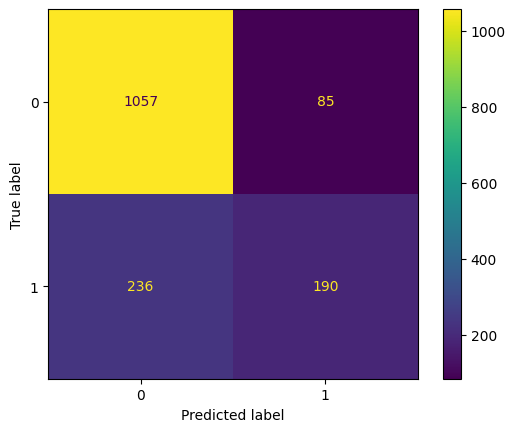

              precision    recall  f1-score   support

           0       0.82      0.93      0.87      1142
           1       0.69      0.45      0.54       426

    accuracy                           0.80      1568
   macro avg       0.75      0.69      0.71      1568
weighted avg       0.78      0.80      0.78      1568

Métricas de avaliação de teste:


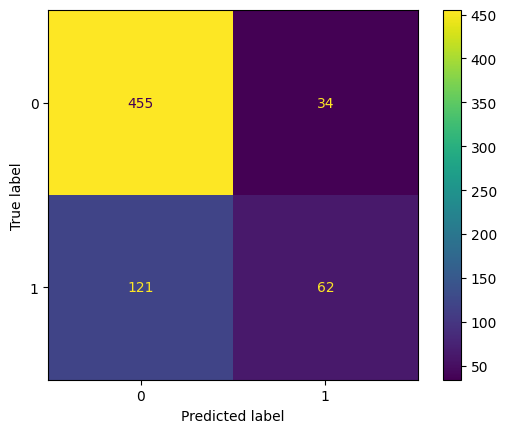

              precision    recall  f1-score   support

           0       0.79      0.93      0.85       489
           1       0.65      0.34      0.44       183

    accuracy                           0.77       672
   macro avg       0.72      0.63      0.65       672
weighted avg       0.75      0.77      0.74       672



In [109]:
print('Métricas de avaliação de treino:')

y_pred_train = grid.predict(X_train)

ConfusionMatrixDisplay.from_predictions(y_train, y_pred_train)
plt.show()

print(classification_report(y_train, y_pred_train))

print('Métricas de avaliação de teste:')
y_pred_test = grid.predict(X_test)

ConfusionMatrixDisplay.from_predictions(y_test, y_pred_test)
plt.show()

print(classification_report(y_test, y_pred_test))

### KNN

In [110]:
# Pipeline:
etapas = [('std_scaler', StandardScaler()),
          ('knn', KNeighborsClassifier())]

pipe = Pipeline(etapas)

In [111]:
# KFold Estratificado para CV:
grupo = StratifiedKFold(n_splits=10, shuffle=True, random_state=42)

metrica = make_scorer(accuracy_score)

In [112]:
# Otimização de hiperparâmetros com GridSearch:
param_grid = {
    'knn__weights' : ['distance', 'uniform'],
    'knn__metric' : ['manhattan', 'euclidean', 'minkowski'],
    'knn__n_neighbors' : range(3, 20)
}

grid = GridSearchCV(estimator=pipe,
                        param_grid=param_grid,
                        scoring=metrica,
                        cv=grupo,
                        n_jobs=-1)

grid.fit(X_train, y_train)

GridSearchCV(cv=StratifiedKFold(n_splits=10, random_state=42, shuffle=True),
             estimator=Pipeline(steps=[('std_scaler', StandardScaler()),
                                       ('knn', KNeighborsClassifier())]),
             n_jobs=-1,
             param_grid={'knn__metric': ['manhattan', 'euclidean', 'minkowski'],
                         'knn__n_neighbors': range(3, 20),
                         'knn__weights': ['distance', 'uniform']},
             scoring=make_scorer(accuracy_score))

In [113]:
# Melhores parâmetros:
grid.best_params_

{'knn__metric': 'manhattan', 'knn__n_neighbors': 9, 'knn__weights': 'distance'}

In [114]:
# Melhor métrica com os melhores parâmetros:
grid.best_score_

0.8016046055854973

Métricas de avaliação de treino:


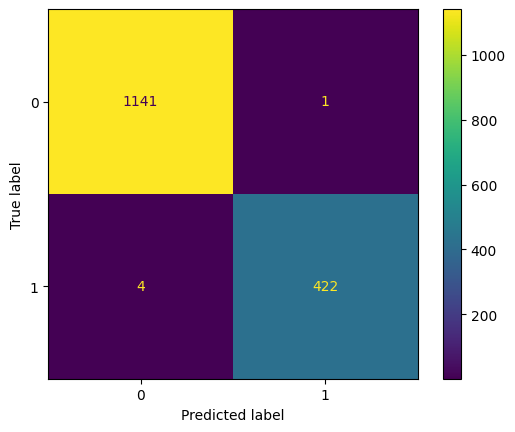

              precision    recall  f1-score   support

           0       1.00      1.00      1.00      1142
           1       1.00      0.99      0.99       426

    accuracy                           1.00      1568
   macro avg       1.00      0.99      1.00      1568
weighted avg       1.00      1.00      1.00      1568

Métricas de avaliação de teste:


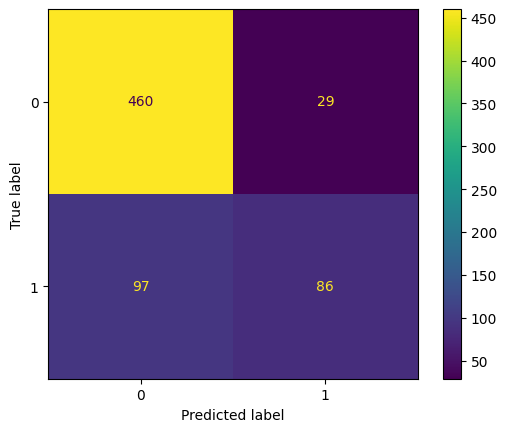

              precision    recall  f1-score   support

           0       0.83      0.94      0.88       489
           1       0.75      0.47      0.58       183

    accuracy                           0.81       672
   macro avg       0.79      0.71      0.73       672
weighted avg       0.80      0.81      0.80       672



In [115]:
print('Métricas de avaliação de treino:')

y_pred_train = grid.predict(X_train)

ConfusionMatrixDisplay.from_predictions(y_train, y_pred_train)
plt.show()

print(classification_report(y_train, y_pred_train))

print('Métricas de avaliação de teste:')
y_pred_test = grid.predict(X_test)

ConfusionMatrixDisplay.from_predictions(y_test, y_pred_test)
plt.show()

print(classification_report(y_test, y_pred_test))

### Árvore de Decisão

In [116]:
# Pipeline:
etapas = [('std_scaler', StandardScaler()),
          ('dt', DecisionTreeClassifier(random_state=42))]

pipe = Pipeline(etapas)

In [118]:
# KFold Estratificado para CV:
grupo = StratifiedKFold(n_splits=10, shuffle=True, random_state=42)

metrica = make_scorer(accuracy_score)

In [119]:
# Otimização de hiperparâmetros com GridSearch:
param_grid = {
    'dt__criterion' : ['gini', 'entropy'],
    'dt__splitter' : ['best', 'random'],
    'dt__max_depth' : range(2, 11)
}

grid = GridSearchCV(estimator=pipe,
                        param_grid=param_grid,
                        scoring=metrica,
                        cv=grupo,
                        n_jobs=-1)

grid.fit(X_train, y_train)

GridSearchCV(cv=StratifiedKFold(n_splits=10, random_state=42, shuffle=True),
             estimator=Pipeline(steps=[('std_scaler', StandardScaler()),
                                       ('dt',
                                        DecisionTreeClassifier(random_state=42))]),
             n_jobs=-1,
             param_grid={'dt__criterion': ['gini', 'entropy'],
                         'dt__max_depth': range(2, 11),
                         'dt__splitter': ['best', 'random']},
             scoring=make_scorer(accuracy_score))

In [120]:
# Melhores parâmetros:
grid.best_params_

{'dt__criterion': 'entropy', 'dt__max_depth': 2, 'dt__splitter': 'best'}

In [121]:
# Melhor métrica com os melhores parâmetros:
grid.best_score_

0.7876408623223909

Métricas de avaliação de treino:


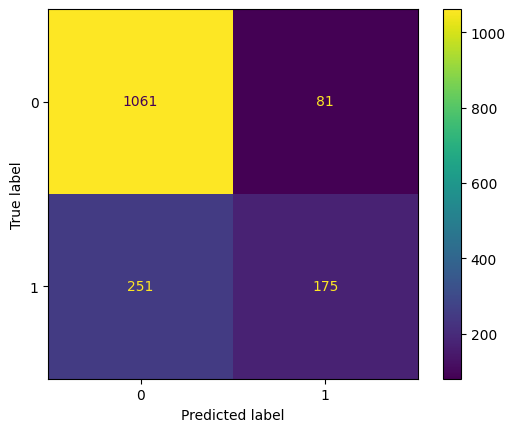

              precision    recall  f1-score   support

           0       0.81      0.93      0.86      1142
           1       0.68      0.41      0.51       426

    accuracy                           0.79      1568
   macro avg       0.75      0.67      0.69      1568
weighted avg       0.77      0.79      0.77      1568

Métricas de avaliação de teste:


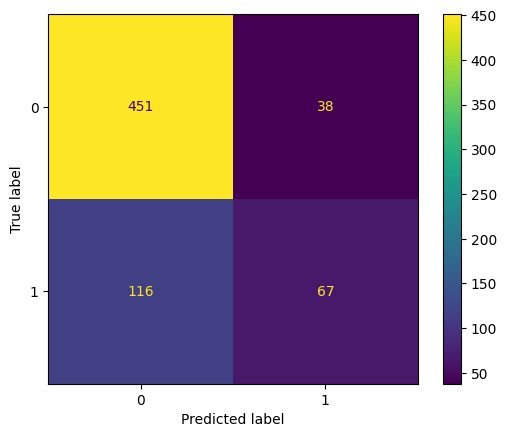

              precision    recall  f1-score   support

           0       0.80      0.92      0.85       489
           1       0.64      0.37      0.47       183

    accuracy                           0.77       672
   macro avg       0.72      0.64      0.66       672
weighted avg       0.75      0.77      0.75       672



In [122]:
print('Métricas de avaliação de treino:')

y_pred_train = grid.predict(X_train)

ConfusionMatrixDisplay.from_predictions(y_train, y_pred_train)
plt.show()

print(classification_report(y_train, y_pred_train))

print('Métricas de avaliação de teste:')
y_pred_test = grid.predict(X_test)

ConfusionMatrixDisplay.from_predictions(y_test, y_pred_test)
plt.show()

print(classification_report(y_test, y_pred_test))

### Random Forest

In [123]:
# Pipeline:
etapas = [('std_scaler', StandardScaler()),
          ('rf', RandomForestClassifier(random_state=42))]

pipe = Pipeline(etapas)

In [124]:
# KFold Estratificado para CV:
grupo = StratifiedKFold(n_splits=10, shuffle=True, random_state=42)

metrica = make_scorer(accuracy_score)

In [125]:
# Otimização de hiperparâmetros com GridSearch:
param_grid = {
    'rf__n_estimators' : range(100, 600, 100),
    'rf__max_depth' : range(3, 6),
    'rf__max_features' : ['sqrt', 'log2'],
    'rf__criterion' : ['entropy', 'gini']
}

grid = GridSearchCV(estimator=pipe,
                        param_grid=param_grid,
                        scoring=metrica,
                        cv=grupo,
                        n_jobs=-1)

grid.fit(X_train, y_train)

GridSearchCV(cv=StratifiedKFold(n_splits=10, random_state=42, shuffle=True),
             estimator=Pipeline(steps=[('std_scaler', StandardScaler()),
                                       ('rf',
                                        RandomForestClassifier(random_state=42))]),
             n_jobs=-1,
             param_grid={'rf__criterion': ['entropy', 'gini'],
                         'rf__max_depth': range(3, 6),
                         'rf__max_features': ['sqrt', 'log2'],
                         'rf__n_estimators': range(100, 600, 100)},
             scoring=make_scorer(accuracy_score))

In [126]:
# Melhores parâmetros:
grid.best_params_

{'rf__criterion': 'gini',
 'rf__max_depth': 5,
 'rf__max_features': 'sqrt',
 'rf__n_estimators': 200}

In [127]:
# Melhor métrica com os melhores parâmetros:
grid.best_score_

0.8010003266372694

Métricas de avaliação de treino:


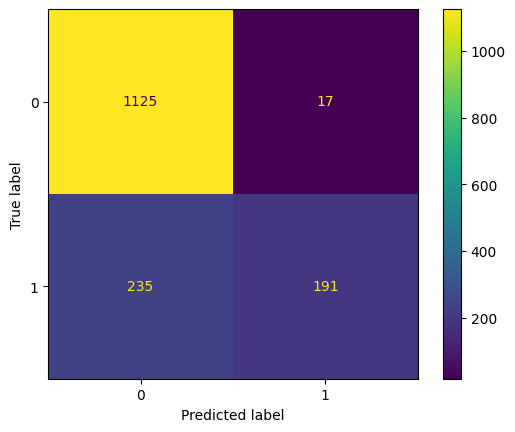

              precision    recall  f1-score   support

           0       0.83      0.99      0.90      1142
           1       0.92      0.45      0.60       426

    accuracy                           0.84      1568
   macro avg       0.87      0.72      0.75      1568
weighted avg       0.85      0.84      0.82      1568

Métricas de avaliação de teste:


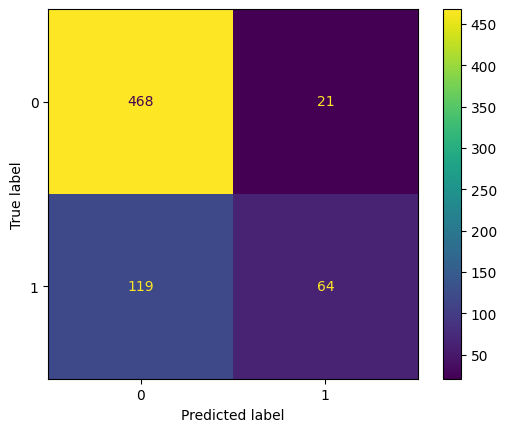

              precision    recall  f1-score   support

           0       0.80      0.96      0.87       489
           1       0.75      0.35      0.48       183

    accuracy                           0.79       672
   macro avg       0.78      0.65      0.67       672
weighted avg       0.79      0.79      0.76       672



In [128]:
print('Métricas de avaliação de treino:')
y_pred_train = grid.predict(X_train)

ConfusionMatrixDisplay.from_predictions(y_train, y_pred_train)
plt.show()

print(classification_report(y_train, y_pred_train))

print('Métricas de avaliação de teste:')
y_pred_test = grid.predict(X_test)

ConfusionMatrixDisplay.from_predictions(y_test, y_pred_test)
plt.show()

print(classification_report(y_test, y_pred_test))

### SVC

In [96]:
# Pipeline:
etapas = [('std_scaler', StandardScaler()),
          ('svc', SVC(random_state=42))]

pipe = Pipeline(etapas)

In [97]:
# KFold Estratificado para CV:
grupo = StratifiedKFold(n_splits=10, shuffle=True, random_state=42)

metrica = make_scorer(accuracy_score)

In [100]:
# Otimização de hiperparâmetros com GridSearch:
param_grid = {'svc__kernel': ['linear', 'rbf', 'poly'],
                 'svc__C': np.logspace(-2,2,5),
                 'svc__gamma': np.logspace(-2,2,5)}

grid = GridSearchCV(estimator= pipe,
                        param_grid= param_grid,
                        scoring=metrica,
                        cv=grupo,
                        n_jobs=-1)

grid.fit(X_train, y_train)

KeyboardInterrupt: ignored

In [ ]:
# Melhores parâmetros:
grid.best_params_

In [ ]:
# Melhor métrica com os melhores parâmetros:
grid.best_score_

In [ ]:
print('Métricas de avaliação de treino:')
y_pred_train = grid.predict(X_train)

ConfusionMatrixDisplay.from_predictions(y_train, y_pred_train)
plt.show()

print(classification_report(y_train, y_pred_train))

print('Métricas de avaliação de teste:')
y_pred_test = grid.predict(X_test)

ConfusionMatrixDisplay.from_predictions(y_test, y_pred_test)
plt.show()

print(classification_report(y_test, y_pred_test))

### AdaBoost

In [ ]:
# Pipeline:
etapas = [('std_scaler', StandardScaler()),
          ('ab', AdaBoostClassifier(random_state = 42))]

pipe = Pipeline(etapas)

In [ ]:
pipe.fit(X_train, y_train)